<a href="https://colab.research.google.com/github/Varshitha2204/Automatic-Segmentation-using-Generative-Adversial-Network/blob/main/segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install -q kaggle

In [ ]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle (1).json


{'kaggle (1).json': b'{"username":"saniya08","key":"79cefd053ffcd3d8eac61ecfb2d2ffbb"}'}

In [ ]:
!mkdir ~/.kaggle

mkdir: cannot create directory ‘/root/.kaggle’: File exists


In [ ]:
!cp kaggle.json ~/.kaggle/

In [ ]:
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle datasets list

ref                                                            title                                               size  lastUpdated          downloadCount  voteCount  usabilityRating  
-------------------------------------------------------------  -------------------------------------------------  -----  -------------------  -------------  ---------  ---------------  
iamsouravbanerjee/customer-shopping-trends-dataset             Customer Shopping Trends Dataset                   146KB  2023-10-05 06:45:37          14373        309  1.0              
sujaykapadnis/world-population-2023-countrywise                World Population 2023 [Countrywise]                  3KB  2023-10-27 05:07:44            989         28  1.0              
nelgiriyewithana/billionaires-statistics-dataset               Billionaires Statistics Dataset (2023)             139KB  2023-09-29 13:39:28           7613        198  1.0              
asaniczka/top-spotify-songs-in-73-countries-daily-updated      Top Spo

In [ ]:
!kaggle datasets download -d truthisneverlinear/childrens-dental-panoramic-radiographs-dataset

childrens-dental-panoramic-radiographs-dataset.zip: Skipping, found more recently modified local copy (use --force to force download)


In [ ]:
!unzip childrens-dental-panoramic-radiographs-dataset.zip

Archive:  childrens-dental-panoramic-radiographs-dataset.zip
replace Dental_dataset/Adult tooth segmentation dataset/Archive/images/1.png? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

In [ ]:
!pip install natsort

In [ ]:
import tensorflow as tf
import numpy as np
import os
from PIL import Image
import matplotlib.pyplot as plt
import cv2
from keras import layers, models
import pathlib
import natsort
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, classification_report
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import MinMaxScaler

In [ ]:
epochs = 50
batch = 16
eta = 0.001
weight_decay = 6e-8
imageShape = (224, 224, 1)
maskShape = (224, 224, 1)

In [ ]:
class readDataset:
    def __init__(self, imagesPathes, masksPathes):
        self.imagesPathes = imagesPathes
        self.masksPathes = masksPathes
    def readPathes(self,):
      self.images = natsort.natsorted(list(pathlib.Path(self.imagesPathes).glob('*.*')))
      self.masks = natsort.natsorted(list(pathlib.Path(self.masksPathes).glob('*.*')))
    def readImages(self, data, typeData):
        images = []
        for img in data:
            img = cv2.imread(str(img), 0)
            img = img/255
            img = cv2.resize(img, (224, 224))
            if typeData == 'm':
                img = np.where(img > 0, 1, 0)
            images.append(img)
        return np.array(images)
    def dataAugmentation(self, images, masks):
        imagesupdate = []
        masksupdate = []
        for image, mask in zip(images, masks):
          for aug in range(2):
            imageup = image
            maskup = mask
            if aug == 0:
              imageup = image
              maskup = mask
            else:
              imageup = tf.image.flip_left_right(imageup)
              maskup = tf.image.flip_left_right(maskup)
            imagesupdate.append(imageup), masksupdate.append(maskup)
        return np.array(imagesupdate), np.array(masksupdate)

In [ ]:
datasetObject = readDataset('/content/Dental_dataset/Adult tooth segmentation dataset/Panoramic radiography database/images',
                            '/content/Dental_dataset/Adult tooth segmentation dataset/Panoramic radiography database/mask')
datasetObject.readPathes()

In [ ]:
len(datasetObject.images), len(datasetObject.masks)

(598, 598)

In [ ]:
images = datasetObject.readImages(datasetObject.images, 'i')
masks = datasetObject.readImages(datasetObject.masks, 'm')
images.shape, masks.shape

((598, 224, 224), (598, 224, 224))

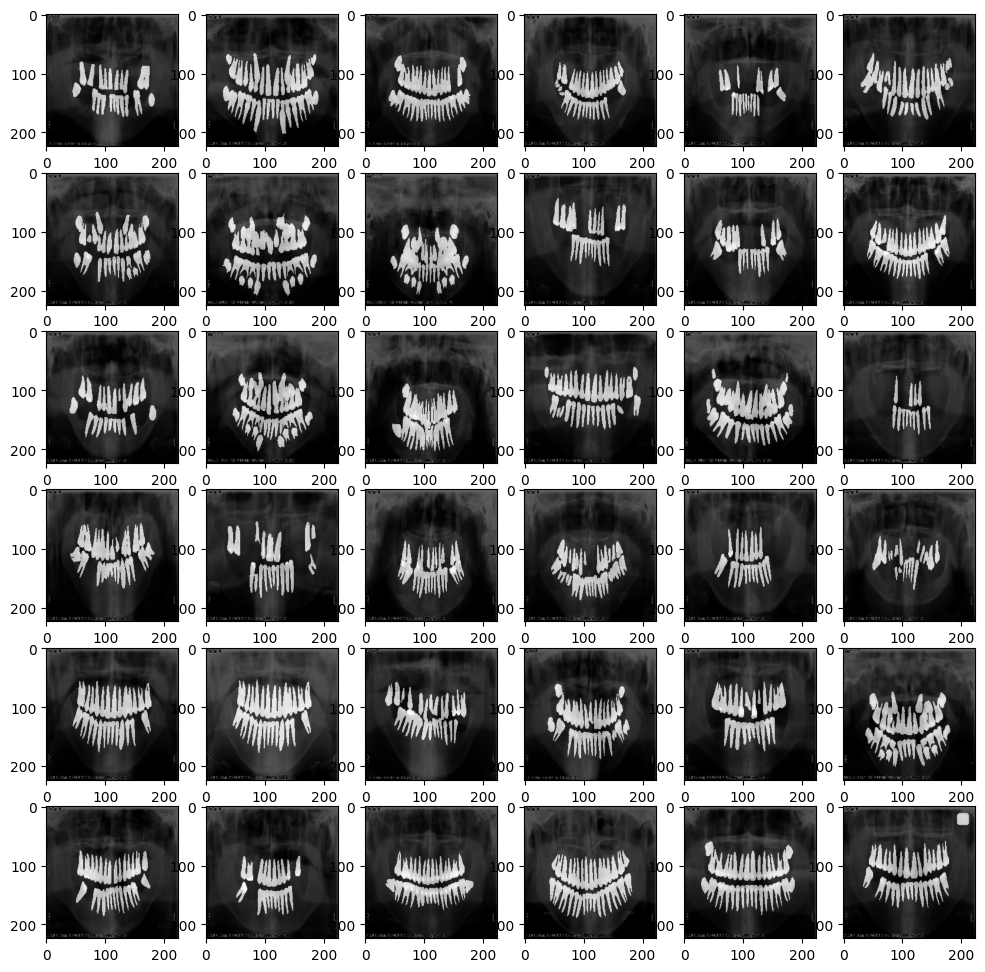

In [ ]:
plt.figure(figsize = (12, 12))
for i in range(36):
    plt.subplot(6, 6, (i + 1))
    plt.imshow(images[i], cmap = 'gray')
    plt.imshow(masks[i], alpha = 0.6, cmap = 'gray')
plt.legend()

In [ ]:
np.unique(masks), np.min(masks), np.max(masks), np.min(images), np.max(masks)

(array([0, 1]), 0, 1, 0.0, 1)

In [ ]:
x = layers.Input(shape = (224, 224, 1))
y = layers.Input(shape = (224, 224, 1))
z = layers.multiply([x, y])
m = models.Model(inputs = [x, y], outputs = z)
m.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 1)]        0         []                            
                                                                                                  
 input_2 (InputLayer)        [(None, 224, 224, 1)]        0         []                            
                                                                                                  
 multiply (Multiply)         (None, 224, 224, 1)          0         ['input_1[0][0]',             
                                                                     'input_2[0][0]']             
                                                                                                  
Total params: 0 (0.00 Byte)
Trainable params: 0 (0.00 Byte)
Non-trainable params: 0 (0.00 Byte

In [ ]:
imagesByMasks = m([images[:64], masks[:64]])
imagesByMasks.shape

TensorShape([64, 224, 224, 1])

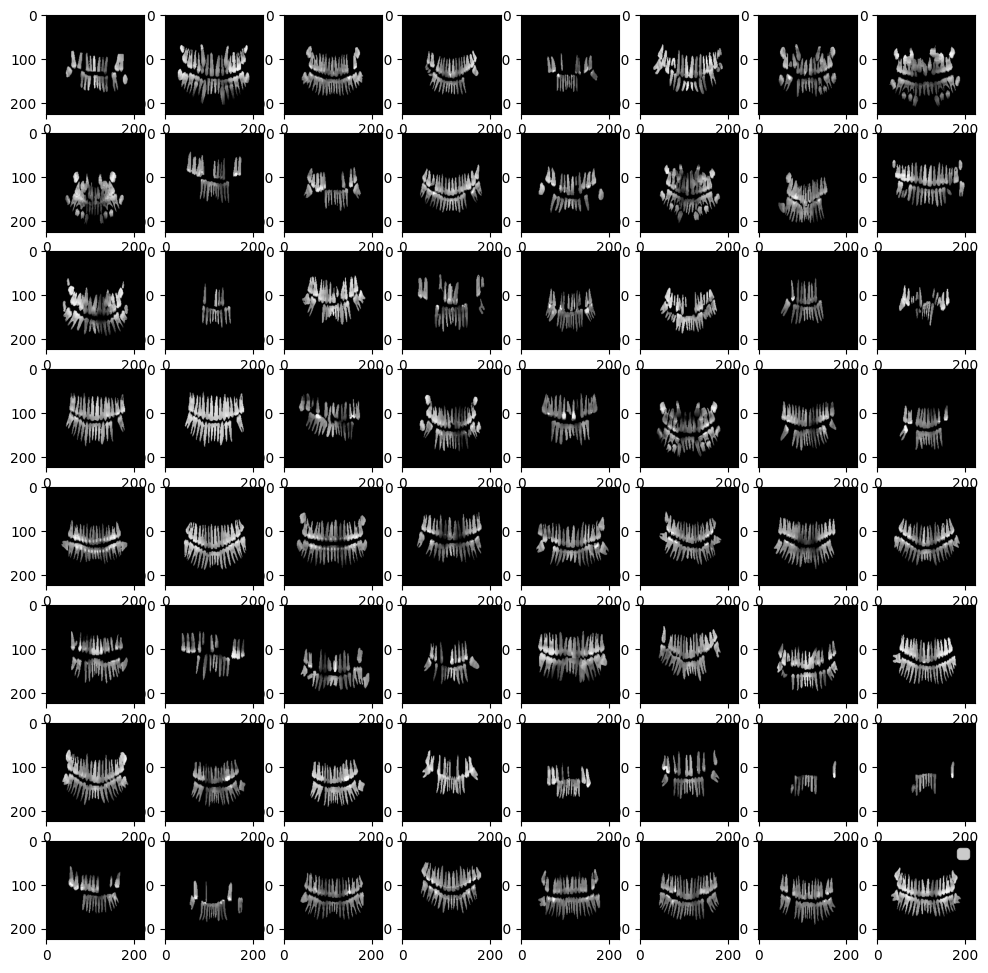

In [ ]:
plt.figure(figsize = (12, 12))
for i in range(64):
    plt.subplot(8, 8, (i + 1))
    plt.imshow(imagesByMasks[i], cmap = 'gray')
plt.legend()

In [ ]:
i = 80
validImages = images[:i]
validMasks = masks[:i]
trainImages = images[i:]
trainMasks = masks[i:]
validImages.shape, validMasks.shape, trainImages.shape, trainMasks.shape

((80, 224, 224), (80, 224, 224), (518, 224, 224), (518, 224, 224))

In [ ]:
from google.colab import files
files.upload()

{}

In [ ]:
def convolution(inputs, filter, padding, strides, kernel, activation, conv_type):
  x = inputs
  x = layers.Conv2D(filter, kernel_size = kernel, padding = padding,
                    strides = strides)(x)
  x = layers.GroupNormalization(groups = filter)(x)
  if conv_type == 'decoder':
      x = layers.Activation(activation)(x)
      x = layers.Conv2D(filter*2, kernel_size = kernel, padding = padding, strides = strides)(x)
      x = layers.GroupNormalization(groups = filter*2)(x)
      x = layers.Activation(activation)(x)
      x = layers.Conv2D(filter, kernel_size = kernel, padding = padding, strides = strides)(x)
      x = layers.GroupNormalization(groups = filter)(x)
  x = layers.average([x, layers.Conv2D(filter, kernel_size = 1, padding = 'same',
                                      strides = 1)(inputs)])
  x = layers.Activation(activation)(x)
  return x

In [ ]:
def encoder(input, filter, padding, strides, kernel, activation):
  x = input
  x = convolution(x, filter, padding, strides, kernel, activation, 'encoder')
  downsample = layers.AveragePooling2D()(x)
  return downsample, x

In [ ]:
def decoder(input, filter, skip, padding, strides, kernel, activation):
  x = input
  x = layers.Conv2DTranspose(filter, kernel_size = kernel, padding = padding,
                             strides = 2, activation = activation)(x)
  x = layers.average([x, skip])
  x = convolution(x, filter, padding, strides, kernel, activation, 'decoder')
  return x

In [ ]:
def generator(input, filter, padding, strides, kernel, weights):
  x = input
  con1, skip1 = encoder(x, filter, padding = padding, strides = strides,
                        kernel = kernel, activation = 'LeakyReLU')
  con2, skip2 = encoder(con1, filter*2, padding = padding, strides = strides,
                        kernel = kernel, activation = 'LeakyReLU')
  con3, skip3 = encoder(con2, filter*4, padding = padding, strides = strides,
                        kernel = kernel, activation = 'LeakyReLU')
  con4, skip4 = encoder(con3, filter*8, padding = padding, strides = strides,
                        kernel = kernel, activation = 'LeakyReLU')
  con5, skip5 = encoder(con4, filter*16, padding = padding, strides = strides,
                        kernel = kernel, activation = 'LeakyReLU')
  deco = decoder(con5, filter*16, skip5, padding = padding, strides = strides,
                  kernel = kernel, activation = 'relu')
  deco1 = decoder(deco, filter*8, skip4, padding = padding, strides = strides,
                  kernel = kernel, activation = 'relu')
  deco2 = decoder(deco1, filter*4, skip3, padding = padding, strides = strides,
                  kernel = kernel, activation = 'relu')
  deco3 = decoder(deco2, filter*2, skip2, padding = padding, strides = strides,
                  kernel = kernel, activation = 'relu')
  deco4 = decoder(deco3, filter, skip1, padding = padding, strides = strides,
                  kernel = kernel, activation = 'relu')
  output = layers.Conv2DTranspose(1, kernel_size = kernel, strides = strides,
                                  padding = padding, activation = 'sigmoid')(deco4)
  generator = models.Model(inputs = input, outputs = output, name = 'generator')
  if weights != None:
     generator.load_weights('/content/seg.h5')
  generator.summary()
  return generator

In [ ]:
G = generator(input = layers.Input(shape = (224, 224, 1)), filter = 32,
              padding = 'same', kernel = 3, strides = 1, weights = None)

Model: "generator"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 224, 224, 1)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 224, 224, 32)         320       ['input_3[0][0]']             
                                                                                                  
 group_normalization (Group  (None, 224, 224, 32)         64        ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 conv2d_1 (Conv2D)           (None, 224, 224, 32)         64        ['input_3[0][0]']     

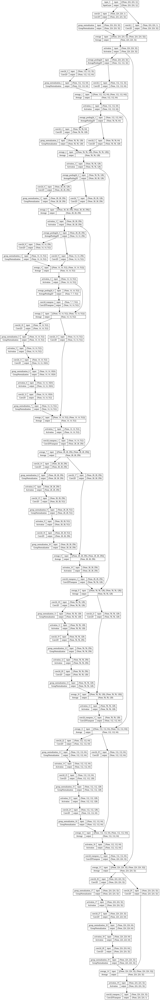

In [ ]:
tf.keras.utils.plot_model(G, show_shapes = True)

In [ ]:
from google.colab import files
files.upload()

{}

In [ ]:
def discriminator(ImageInput, maskInput, filter, padding, strides, kernel, weights,
                  lossFn, learning_rate, weight_decay):
  x = layers.multiply([ImageInput, maskInput])
  con1, skip1 = encoder(x, filter, padding = padding, strides = strides,
                        kernel = kernel, activation = 'LeakyReLU')
  con2, skip2 = encoder(con1, filter*2, padding = padding, strides = strides,
                        kernel = kernel, activation = 'LeakyReLU')
  con3, skip3 = encoder(con2, filter*4, padding = padding, strides = strides,
                        kernel = kernel, activation = 'LeakyReLU')
  con4, skip4 = encoder(con3, filter*8, padding = padding, strides = strides,
                        kernel = kernel, activation = 'LeakyReLU')
  con5, skip5 = encoder(con4, filter*16, padding = padding, strides = strides,
                        kernel = kernel, activation = 'LeakyReLU')
  x = layers.GlobalAveragePooling2D()(con5)
  x = layers.Dropout(0.1)(x)
  x = layers.Dense(1)(x)
  discriminator = models.Model(inputs = [maskInput, ImageInput], outputs = x,
                              name = 'discriminator')
  if weights != None:
    discriminator.load_weights('/content/discrim.h5')
  discriminator.compile(loss = lossFn, optimizer = tf.keras.optimizers.RMSprop(learning_rate = learning_rate,
                                                                              weight_decay = weight_decay))
  discriminator.summary()
  return discriminator

In [ ]:
D = discriminator(ImageInput = layers.Input(shape = imageShape), maskInput = layers.Input(shape = maskShape),
                  filter = 32, padding = 'same', strides = 1, kernel = 3, weights = None,
                  lossFn = 'mse', learning_rate = eta, weight_decay = weight_decay)

Model: "discriminator"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_4 (InputLayer)        [(None, 224, 224, 1)]        0         []                            
                                                                                                  
 input_5 (InputLayer)        [(None, 224, 224, 1)]        0         []                            
                                                                                                  
 multiply_1 (Multiply)       (None, 224, 224, 1)          0         ['input_4[0][0]',             
                                                                     'input_5[0][0]']             
                                                                                                  
 conv2d_30 (Conv2D)          (None, 224, 224, 32)         320       ['multiply_1[0][0]

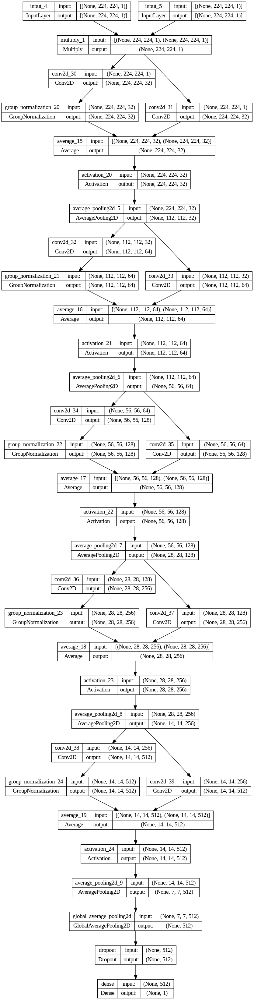

In [ ]:
tf.keras.utils.plot_model(D, show_shapes = True)

In [ ]:
def GAN(discriminator, generator, imageInput, maskInput, learning_rate, weight_decay,
                   lossFn):
  discriminator.trainable = False
  gan = models.Model(
      inputs = [imageInput],
      outputs = discriminator([generator(imageInput), imageInput],),
      name = 'gan'
  )
  gan.compile(loss = lossFn, optimizer = tf.keras.optimizers.RMSprop(learning_rate = learning_rate*0.5,
                                                                              weight_decay = weight_decay*0.5))
  gan.summary()
  return gan

In [ ]:
gan = GAN(discriminator = D, generator = G, imageInput = layers.Input(shape = imageShape),
          maskInput = layers.Input(shape = maskShape), learning_rate = eta, weight_decay = weight_decay,
                   lossFn = 'mse')

Model: "gan"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_6 (InputLayer)        [(None, 224, 224, 1)]        0         []                            
                                                                                                  
 generator (Functional)      (None, 224, 224, 1)          2174774   ['input_6[0][0]']             
                                                          5                                       
                                                                                                  
 discriminator (Functional)  (None, 1)                    1745601   ['generator[0][0]',           
                                                                     'input_6[0][0]']             
                                                                                                

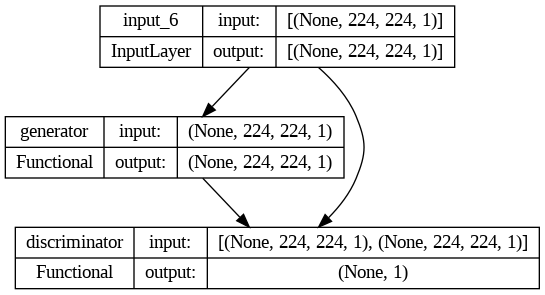

In [ ]:
tf.keras.utils.plot_model(gan, show_shapes = True)

In [ ]:
def samples(generator, images, realMasks):
  masks = tf.squeeze(generator.predict(images))
  all = np.vstack([realMasks, masks])
  plt.figure(figsize = (12, 4))
  for i in range(16):
    plt.subplot(2, 8, (i + 1))
    plt.imshow(all[i], cmap = 'gray')
  plt.show()

Epoch/Epochs: 0/50
discriminator loss: [tag: 0.15300551056861877,], generator loss: [tag: 1.1915667057037354,]
1/1 [==============================] - 6s 6s/step


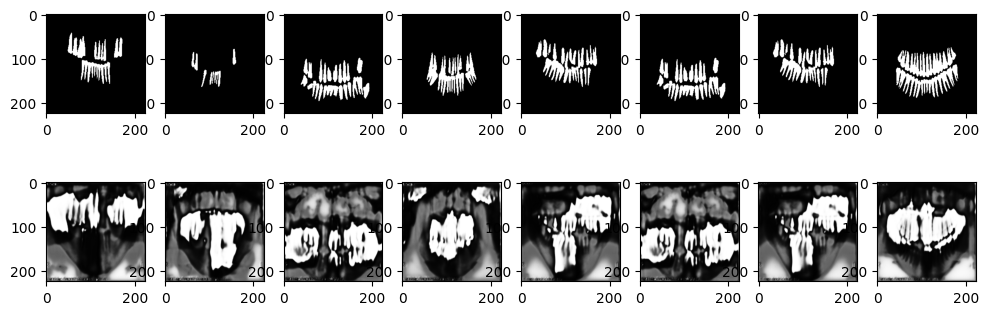

Epoch/Epochs: 5/50
discriminator loss: [tag: 0.15924829244613647,], generator loss: [tag: 0.5423375368118286,]
1/1 [==============================] - 7s 7s/step


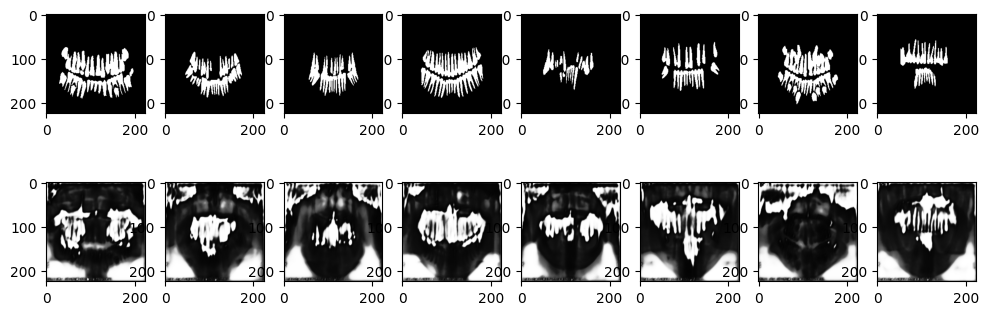

Epoch/Epochs: 10/50
discriminator loss: [tag: 0.0973668098449707,], generator loss: [tag: 1.4275825023651123,]
1/1 [==============================] - 5s 5s/step


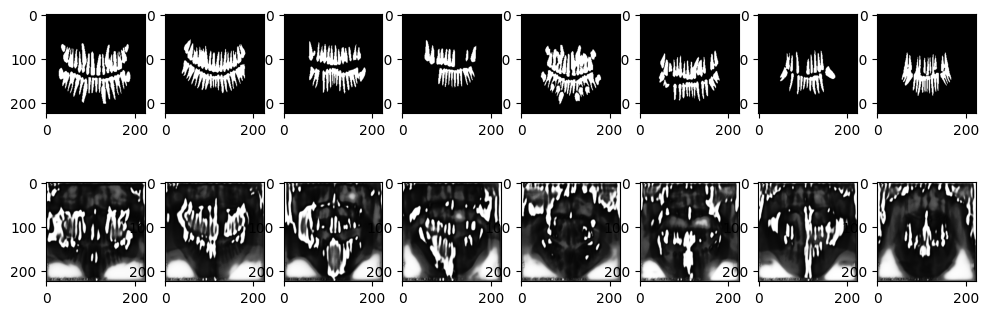

Epoch/Epochs: 15/50
discriminator loss: [tag: 0.18596968054771423,], generator loss: [tag: 0.21038782596588135,]
1/1 [==============================] - 5s 5s/step


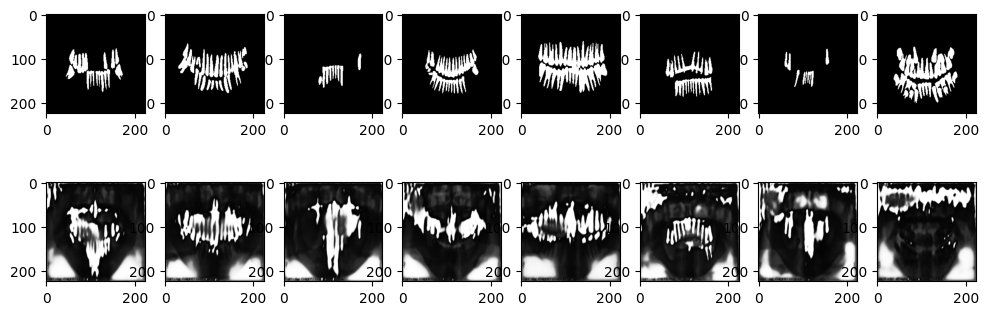

Epoch/Epochs: 20/50
discriminator loss: [tag: 0.08071698248386383,], generator loss: [tag: 1.0058666467666626,]
1/1 [==============================] - 6s 6s/step


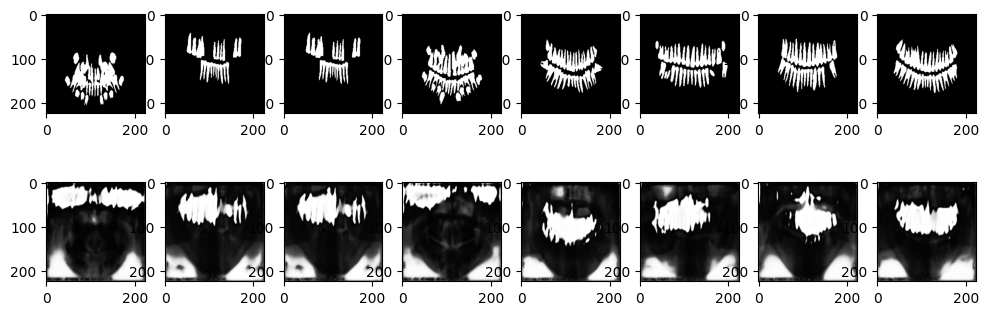

Epoch/Epochs: 25/50
discriminator loss: [tag: 0.1610388606786728,], generator loss: [tag: 0.2999599277973175,]
1/1 [==============================] - 7s 7s/step


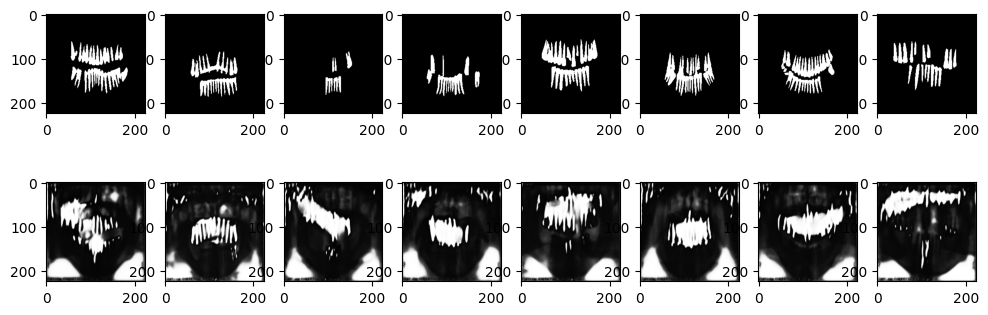

Epoch/Epochs: 30/50
discriminator loss: [tag: 0.09807421267032623,], generator loss: [tag: 0.301685094833374,]
1/1 [==============================] - 6s 6s/step


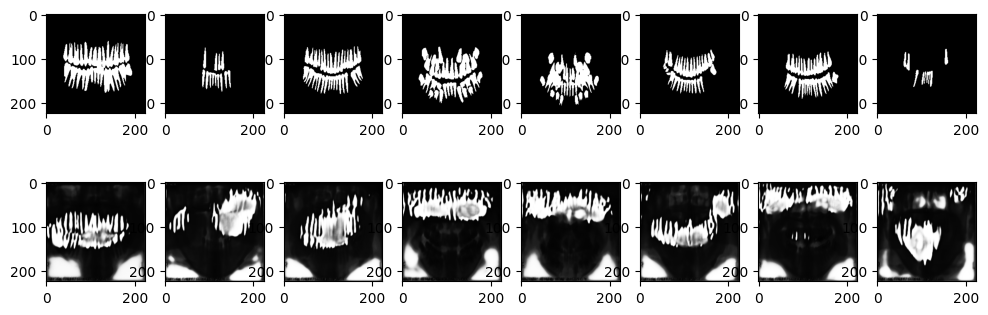

Epoch/Epochs: 35/50
discriminator loss: [tag: 0.05280951410531998,], generator loss: [tag: 0.3705788254737854,]
1/1 [==============================] - 5s 5s/step


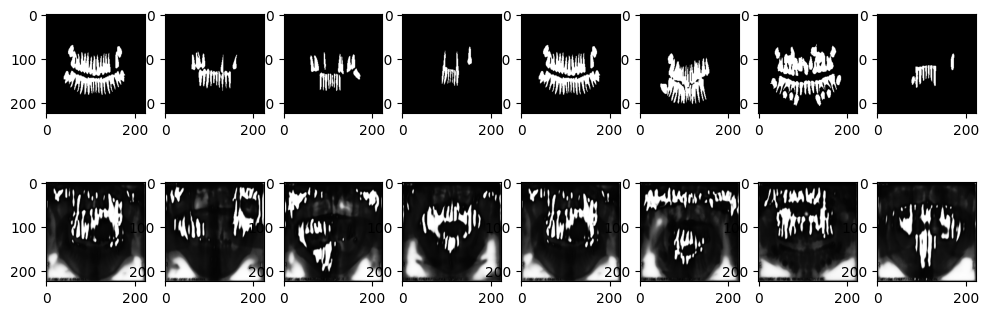

Epoch/Epochs: 40/50
discriminator loss: [tag: 0.16913768649101257,], generator loss: [tag: 1.0476670265197754,]
1/1 [==============================] - 6s 6s/step


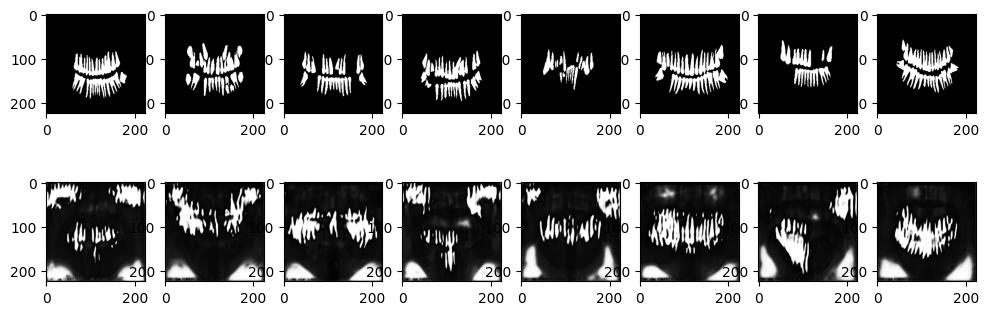

Epoch/Epochs: 45/50
discriminator loss: [tag: 0.07087439298629761,], generator loss: [tag: 1.2292633056640625,]
1/1 [==============================] - 7s 7s/step


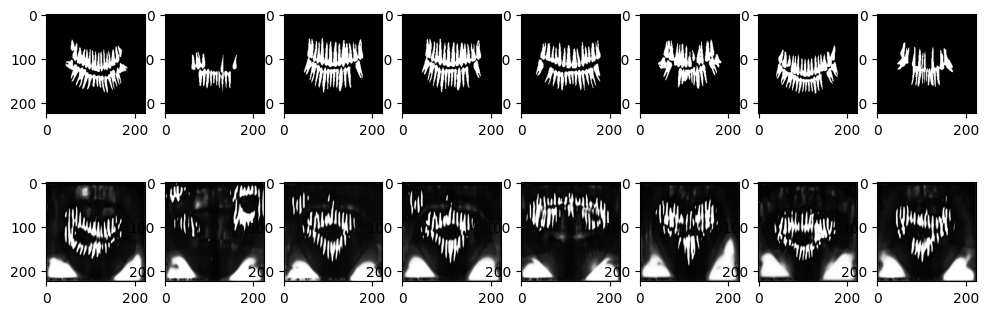

In [ ]:
for epoch in range(epochs):
    indexs = np.random.randint(0, len(trainImages), size = (batch, ))
    realImages = trainImages[indexs]
    realMasks = trainMasks[indexs]
    realTag = tf.ones(shape = (batch, ))
    fakeMasks = tf.squeeze(G.predict([realImages], verbose = 0))
    fakeTag = tf.zeros(shape = (batch, ))
    allMasks = np.vstack([realMasks, fakeMasks])
    allTags = np.hstack([realTag, fakeTag])
    allImages = np.vstack([realImages, realImages])
    dlossTag = D.train_on_batch([allMasks, allImages], [allTags])
    glossTag = gan.train_on_batch([realImages], [realTag,])
    if epoch % 5 == 0:
        print('Epoch/Epochs: {}/{}'.format(epoch, epochs))
        print('discriminator loss: [tag: {},], generator loss: [tag: {},]'.format(dlossTag, glossTag))
        validIndexs = np.random.randint(0, len(validImages), size = (8, ))
        samples(G, validImages[validIndexs], validMasks[validIndexs])

In [ ]:
from google.colab import files
files.upload()

Saving masks_gen.h5 to masks_gen.h5


{'masks_gen.h5': b''}

In [ ]:
from google.colab import files
files.upload()

Saving masks_discrim.h5 to masks_discrim.h5


{'masks_discrim.h5': b''}

In [ ]:
G.save_weights('/content/seg.h5')
D.save_weights('/content/discrim.h5')

In [ ]:
G = generator(input = layers.Input(shape = (224, 224, 1)), filter = 32,
              padding = 'same', kernel = 3, strides = 1, weights = True)
for layer in G.layers[:20]:
  layer.trainable = False
G.compile(loss = tf.keras.losses.BinaryFocalCrossentropy(),
                  optimizer = tf.keras.optimizers.Adam(learning_rate = 0.00001),
                  metrics = ['accuracy', tf.keras.metrics.Precision(name = 'precision'),
                             tf.keras.metrics.Recall(name = 'recall')])
G.summary()

Model: "generator"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_12 (InputLayer)       [(None, 224, 224, 1)]        0         []                            
                                                                                                  
 conv2d_160 (Conv2D)         (None, 224, 224, 32)         320       ['input_12[0][0]']            
                                                                                                  
 group_normalization_105 (G  (None, 224, 224, 32)         64        ['conv2d_160[0][0]']          
 roupNormalization)                                                                               
                                                                                                  
 conv2d_161 (Conv2D)         (None, 224, 224, 32)         64        ['input_12[0][0]']    

In [ ]:
G.evaluate(validImages, validMasks)

3/3 [==============================] - 84s 23s/step - loss: 0.8524 - accuracy: 0.7726 - precision: 0.1799 - recall: 0.2787


[0.8523975610733032,
 0.7725843191146851,
 0.17992408573627472,
 0.2787472605705261]

In [ ]:
G.evaluate(trainImages, trainMasks)

17/17 [==============================] - 488s 28s/step - loss: 0.8440 - accuracy: 0.7735 - precision: 0.1861 - recall: 0.2877


[0.8440255522727966,
 0.7734914422035217,
 0.1861361265182495,
 0.2876969575881958]

In [ ]:
history = G.fit(trainImages, trainMasks, epochs = 3, batch_size = 8,
                        validation_data = (validImages, validMasks), callbacks = [
                            tf.keras.callbacks.EarlyStopping(patience = 5, monitor = 'val_loss',
                                                             mode = 'min',
                                                             restore_best_weights = True)
                        ])

Epoch 1/3
65/65 [==============================] - 1375s 21s/step - loss: 0.0433 - accuracy: 0.9477 - precision: 0.7985 - recall: 0.7289 - val_loss: 0.0421 - val_accuracy: 0.9476 - val_precision: 0.7984 - val_recall: 0.7236
Epoch 2/3
65/65 [==============================] - 1311s 20s/step - loss: 0.0377 - accuracy: 0.9506 - precision: 0.8118 - recall: 0.7429 - val_loss: 0.0382 - val_accuracy: 0.9495 - val_precision: 0.8059 - val_recall: 0.7344
Epoch 3/3
65/65 [==============================] - 1261s 19s/step - loss: 0.0344 - accuracy: 0.9528 - precision: 0.8250 - recall: 0.7483 - val_loss: 0.0354 - val_accuracy: 0.9514 - val_precision: 0.8149 - val_recall: 0.7428


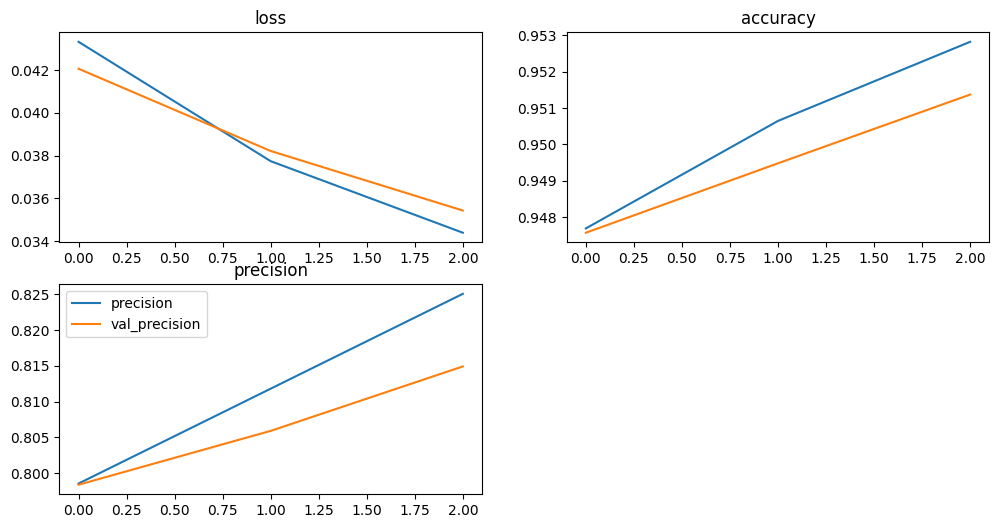

In [ ]:
metrics = ['loss','accuracy', 'precision']
plt.figure(figsize = (12, 6))
for i in range(3):
    plt.subplot(2, 2, (i + 1))
    plt.plot(history.history['{}'.format(metrics[i])], label = '{}'.format(metrics[i]))
    plt.plot(history.history['val_{}'.format(metrics[i])], label = 'val_{}'.format(metrics[i]))
    plt.title('{}'.format(metrics[i]))
plt.legend()

In [ ]:
G.evaluate(validImages, validMasks)

3/3 [==============================] - 63s 19s/step - loss: 0.0354 - accuracy: 0.9514 - precision: 0.8149 - recall: 0.7428


[0.035431817173957825,
 0.951370358467102,
 0.8149081468582153,
 0.7428074479103088]

In [ ]:
G.evaluate(trainImages, trainMasks)

17/17 [==============================] - 411s 24s/step - loss: 0.0327 - accuracy: 0.9541 - precision: 0.8295 - recall: 0.7561


[0.03271486982703209, 0.9540920853614807, 0.82950758934021, 0.7560832500457764]

In [ ]:
G.save('final_tooth_mask_generation.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
G = tf.keras.models.load_model('final_tooth_mask_generation.h5')

In [ ]:
masks_pred = G.predict(validImages)
masks_pred = (masks_pred >= 0.5).astype('int')

3/3 [==============================] - 65s 19s/step


In [ ]:
masks_pred.shape

(80, 224, 224, 1)

In [ ]:
def draw(images, masks, y_pred):
  plt.figure(figsize = (12, 50))
  index = -1
  n = np.random.randint(y_pred.shape[0])
  for i in range(120):
    plt.subplot(20, 6, (i + 1))
    if index == -1:
      plt.imshow(images[n], cmap = 'gray')
      plt.title('Image')
      index = 0
    elif index == 0:
      plt.imshow(images[n], cmap = 'gray')
      plt.imshow(masks[n], alpha = 0.6, cmap = 'gray')
      plt.title('Original Mask')
      index = 1
    elif index == 1:
      plt.imshow(images[n], cmap = 'gray')
      plt.imshow(np.reshape(y_pred[n], (224, 224)), alpha = 0.6, cmap = 'gray')
      plt.title('Predict Mask')
      index = -1
      n = np.random.randint(y_pred.shape[0])
  plt.legend()

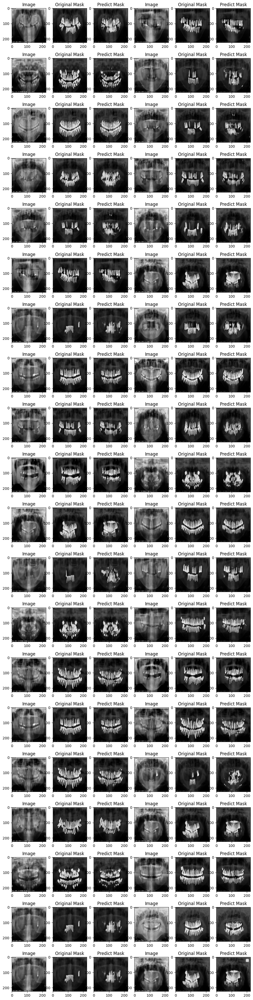

In [ ]:
draw(validImages, validMasks, masks_pred)

In [ ]:
masks_pred = G.predict(trainImages)
masks_pred = (masks_pred >= 0.5).astype('int')

17/17 [==============================] - 434s 26s/step


In [ ]:
masks_pred.shape

(518, 224, 224, 1)

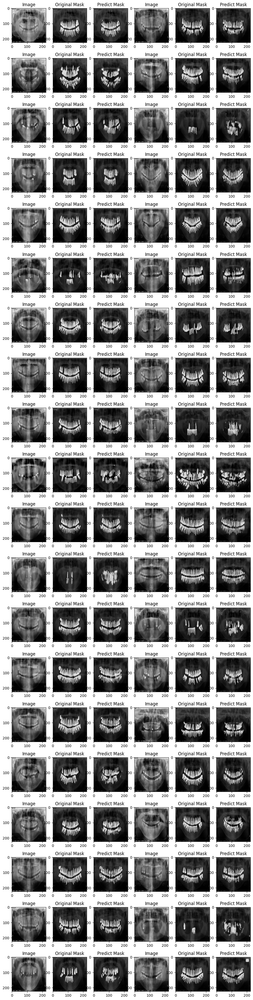

In [ ]:
draw(trainImages, trainMasks, masks_pred)